# Introduction to Geospatial AI

# Intro
Welcome to this workshop about geospatial AI! In this workshop you will try to detect buildings from aerial images. This is done in three steps;

1. Creating training data. We have two different sources of data; A WMS containing aerial images and an OpenStreetMap database to get the locations of buildings.
2. Training machine learning models using the created training data.
3. Evaluating the trained models and predicting where buildings are located in images the models haven't seen before.

We will be using jupyter notebooks with Google Colab, but you don't need to have any experience with these in order to complete this workshop.

# Task 0.0 - Select GPU env

But first, we need to change the runtime to a GPU. In the top right corner click the "triangle" and choose `Change runtime type` and select `T4 GPU`.

Next, we need to clone the git repo we are working with and install some dependencies. To do this simply run the cell below.

In [1]:
!git clone https://github.com/kartAI/kartAI.git
!git -C /content/kartAI/ checkout origin/workshop env.py

!pip install focal_loss
!pip install azure-storage-blob
!pip install rasterio
!pip install rasterstats
!pip install colour

Cloning into 'kartAI'...
remote: Enumerating objects: 1065, done.
remote: Counting objects: 100% (149/149), done.
remote: Compressing objects: 100% (80/80), done.
remote: Total 1065 (delta 84), reused 69 (delta 69), pack-reused 916
Receiving objects: 100% (1065/1065), 1.80 MiB | 12.52 MiB/s, done.
Resolving deltas: 100% (723/723), done.
Updated 1 path from 916a21a
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 394.5/394.5 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.4/193.4 kB 21.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.7/41.7 kB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.6/20.6 MB 53.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.9/137.9 kB 5.0 MB/s eta 0:00:00


# Task 0.1 - Insert secrets

The next step is to insert secrets. Here is how to do it;

1. Go to the github gist (where you found the link to this notebook)
2. Insert the secrets in the next cell and run it.

In [2]:
import sys
import os

sys.path.insert(0,'/content/kartAI')

os.environ['NK_WMS_API_KEY'] = "765E8CBC-C9C6-4A7C-BA45-95EAD903B32E"
os.environ['OSM_DB_PWD'] = "1{65Eb?R-3q>"

# Task 1.1 - Select your training dataset

Your first task is to select which area you want to create training data for.

1. Select a name for your area by changing the variable "training_dataset_name"
2. Choose an area by uncommenting the code for one of our three predefined areas

In [3]:
# Set the name of your training set
training_dataset_name = "Typisk Skoyen"

""" Uncomment (remove the #) for the area you want to use """

""" This area covers Sand, outside of Jessheim """
# area = { "x_min": 618296.0, "x_max": 620895.0, "y_min": 6668145.0, "y_max": 6670133.0 }

""" This area covers Skøyen, Oslo """
area = { "x_min": 593150.9, "x_max": 596528.0, "y_min": 6643812.3, "y_max": 6644452.2 }

""" This area covers Midtbyen, Trondheim """;
# area = { "x_min": 568372.6, "x_max": 570820.4, "y_min": 7033216.7, "y_max": 7034223.7 }

try:
  print(f"Woho!\nSelected area {area} with name {training_dataset_name}")
except:
  print("ERROR! \nYou have not selected one of the areas to create data for. Uncomment one of the tree options in the cell.")

Woho!
Selected area {'x_min': 593150.9, 'x_max': 596528.0, 'y_min': 6643812.3, 'y_max': 6644452.2} with name Typisk Skoyen


# Task 1.2 - Create training data
Your next task is to create training data for your selected area.

The training data is downloaded as rasters (images) and added to a new directory called "training_data", that can be seen in the directory menu on the left. The data is split into training, validation and test.

While downloading the rasters, it will say how many rasters that will be downloaded in total.
The process is time consuming, and will take around 10 minutes.

In [4]:
from kartAI.kartai.tools.create_training_data import create_training_data
import os

# If there already are downloaded images, we wipe them to avoid messing up the file paths and visualizations.
try:
  dir = "/content/training_data/OrtofotoWMS/25832_563000.0_6623000.0_100.0_100.0/512/"
  for f in os.listdir(dir):
      os.remove(os.path.join(dir, f))
except FileNotFoundError:
  pass


create_training_data(
    training_dataset_name=training_dataset_name,
    config_file_path="kartAI/config/dataset/osm_bygg.json",
    eager_load=True,
    confidence_threshold=None,
    eval_model_checkpoint=None,
    region=None,
    x_min=area["x_min"],
    x_max=area["x_max"],
    y_min=area["y_min"],
    y_max=area["y_max"],
    num_processes=None
)

-------creating dataset ------- 
 name: Typisk Skoyen
301 208
feature count:  15
request status is 200

Added to dataset, total instances: 1 of 245
302 208
feature count:  17
request status is 200

Added to dataset, total instances: 2 of 245
303 208
feature count:  27
request status is 200

Added to dataset, total instances: 3 of 245
304 208
feature count:  23
request status is 200

Added to dataset, total instances: 4 of 245
305 208
feature count:  14
request status is 200

Added to dataset, total instances: 5 of 245
306 208
feature count:  4
request status is 200

Added to dataset, total instances: 6 of 245
307 208
feature count:  2
request status is 200

Added to dataset, total instances: 7 of 245
308 208
feature count:  7
request status is 200

Added to dataset, total instances: 8 of 245
309 208
feature count:  6
request status is 200

Added to dataset, total instances: 9 of 245
310 208
feature count:  4
request status is 200

Added to dataset, total instances: 10 of 245
311 208
fe

'training_data/created_datasets/Typisk Skoyen'

# Task 1.3 - Visualize training data
After downloading the data you can visualize it in the next cell.


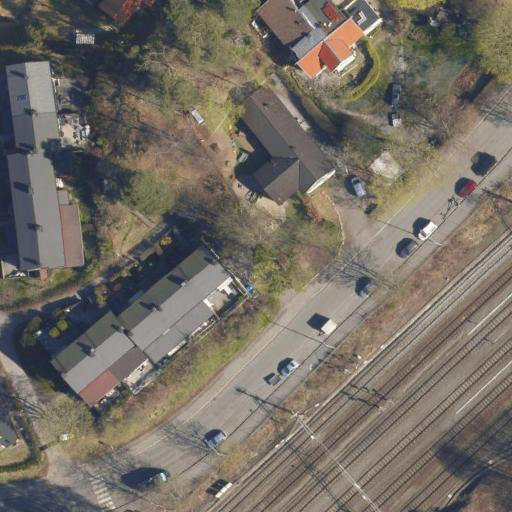
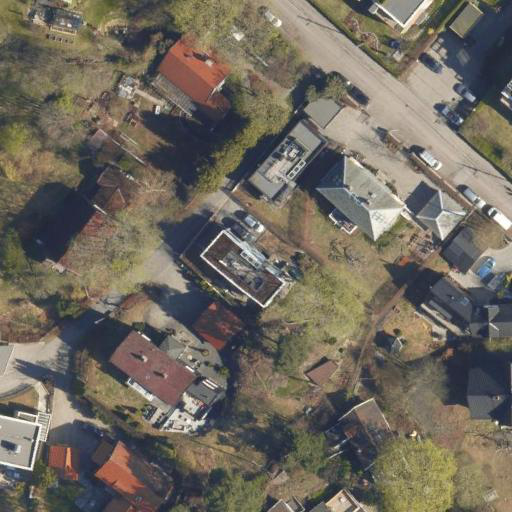
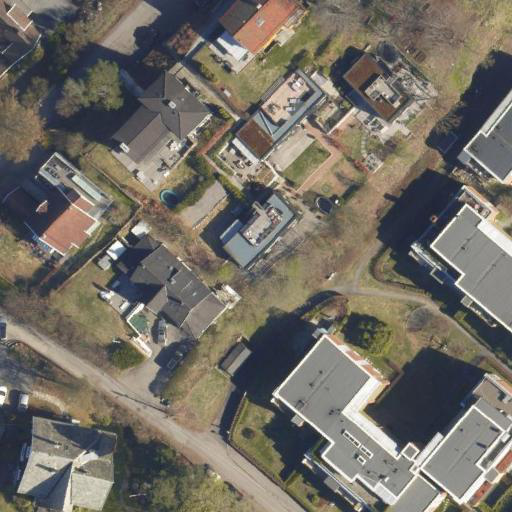
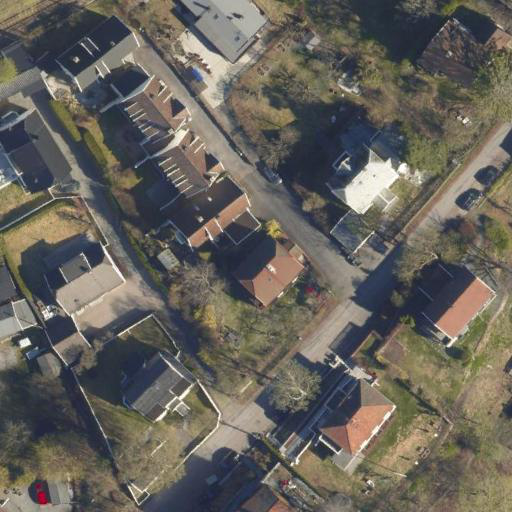
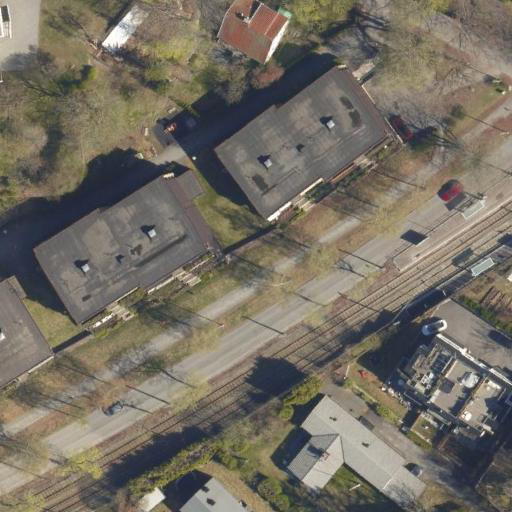

In [5]:
import folium
import rasterio
import os

from pyproj import CRS, Transformer

path_to_dir = "/content/training_data/OrtofotoWMS/25832_563000.0_6623000.0_100.0_100.0/512/"
files = os.listdir(path_to_dir)
files.sort()

crs_25832 = CRS.from_epsg(25832)
crs_4326 = CRS.from_epsg(4326)
transformer = Transformer.from_crs(crs_25832, crs_4326)

fig = folium.Figure(width=800, height=400)
m = folium.Map(
    location=transformer.transform(area["x_min"], area["y_max"]),
    zoom_start=14
)

for i in range(5): # Load 5 rasters. Change this to load fewer/more rasters. Be aware that loading many rasters is slow.
    with rasterio.open(f"{path_to_dir}{files[i]}") as src:
        img = src.read()
        transformed_bottom_left = transformer.transform(src.bounds.left, src.bounds.bottom)
        transformed_top_right = transformer.transform(src.bounds.right, src.bounds.top)
    m.add_child(folium.raster_layers.ImageOverlay(img.transpose(1, 2, 0), bounds = [transformed_bottom_left, transformed_top_right]))

fig.add_child(m)

# Task 2.1 - Choose model type and hyperparameters
After creating and visualizing the training data we are ready to train our model! Before we start training the model we need to decide what kind of model you want to build. Give your model a name and choose hyperparameters you want to work with.

The `model` argument below decides what kind of model architecture you want to use. The supported ones are
 - `unet`. The “U-Net” architecture consists of 2 parts: the first part is a “classic” Convolutional Neural Network which scans the image, extract patterns from it, and combine them into high resolutions features. Then, the network is asked to upscale its hidden layers into recreating a full binary image, where each pixel is either 0 or 1.
 - `resnet`. Residual Network (ResNet) architecture is a type of artificial neural network that allows the model to skip layers without affecting performance and therefore circumventing the vanishing gradient problem.
 - `CSP`. A Cross Stage Partial (CSP) block is designed to attribute the problem of duplicate gradient information within network optimization. The input is split into two paths, where one path is goes through a dense block, while the other skips the block and joins at the end. This means complexity can be reduced while maintaining the accuracy.

If you want to know more about the models and their architecture feel free to ask us or google them!

In [6]:
# Choose model name and architecture
model_name = "Anders_very_regular_unet_model"
model_architecture = "unet" #CSP, resnet

train_args = {
      "features": 32,
      "depth": 4,
      "optimizer": "RMSprop",
      "batch_size": 8,
      "model": model_architecture,
      "loss": "binary_crossentropy",
      "activation": "relu",
      "epochs": 20
}

# Task 2.2 - Train your own machine learning model
The models you're about to train performs what is known as a per-pixel classification. In other words, the model tries to assign a class (either a building or not a building) for each pixel in the raster based on the input features. After the model is trained we can create vector data from the predicted pixels and therefore end up with bounding boxes we can look at!

In the next cell you can tune some hyperparameters, but make sure the training doesn't take too long. The default configuration should take about ~15 minutes to execute and should get you a _decent_ model.

While training, the terminal will print some statistics. These can be a little bit confusing, and it's not a must to understand all of them. The stats showing are;

 - Loss: A measurement of how wrong the model is. The lower the loss is, the better. If the loss is 0, the model is "perfect". A model tries to minimize this value.
 - Binary Accuracy: A measurement of how many of the predicted pixels are inside a building. It's a number between 0 and 1, where higher is better. 1 means all the pixels the model says are within a building is actually within a building. But keep in mind even if the number is 1, the model might not have made predictions for all pixels in all buildings...
 - IoU: Intersection over Union. A measurement of how much of the estimated area overlaps with a building. It's a number between 0 and 1, where higher is better. 1 means the model is fitting the bounding box of all buildings "perfectly".
 - IoU_fz: Fuzzy set variant of IoU. Shares similar characteristics as described earlier.
 - IoU_point_[5-9]: Cutoff values for IoU. It's a measurement of what the IoU would be if the cutoff values was [5-9].
 - val_x: The validation equivalent of whatever x is. X could be loss, IoU, etc.

In [7]:
from kartAI.kartai.tools.train import train

train(
      checkpoint_name=model_name,
      dataset_name=[training_dataset_name],
      input_generator_config_path="kartAI/config/ml_input_generator/ortofoto.json",
      save_model=False, #To cloud, local saving is default
      train_args=train_args,
      checkpoint_to_finetune=False
)


Model: "unet"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 512, 512, 3)]        0         []                            
                                                                                                  
 initial_layer_conv (Conv2D  (None, 512, 512, 32)         864       ['input_1[0][0]']             
 )                                                                                                
                                                                                                  
 initial_layer_batchnorm (B  (None, 512, 512, 32)         128       ['initial_layer_conv[0][0]']  
 atchNormalization)                                                                               
                                                                                               

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


21/21 [==============================] - 53s 1s/step - loss: 0.4811 - binary_accuracy: 0.7896 - IoU: 0.3110 - IoU_fz: 0.3110 - Iou_point_5: 0.3866 - Iou_point_6: 0.3355 - Iou_point_7: 0.2788 - Iou_point_8: 0.2205 - Iou_point_9: 0.1493 - val_loss: 2.8307 - val_binary_accuracy: 0.2886 - val_IoU: 0.3019 - val_IoU_fz: 0.3019 - val_Iou_point_5: 0.2882 - val_Iou_point_6: 0.2894 - val_Iou_point_7: 0.2972 - val_Iou_point_8: 0.3255 - val_Iou_point_9: 0.3602 - lr: 0.0010
Epoch 2/20
21/21 [==============================] - ETA: 0s - loss: 0.3807 - binary_accuracy: 0.8392 - IoU: 0.3856 - IoU_fz: 0.3856 - Iou_point_5: 0.5054 - Iou_point_6: 0.4399 - Iou_point_7: 0.3576 - Iou_point_8: 0.2760 - Iou_point_9: 0.1855
Epoch 2: val_IoU did not improve from 0.30190
21/21 [==============================] - 20s 944ms/step - loss: 0.3807 - binary_accuracy: 0.8392 - IoU: 0.3856 - IoU_fz: 0.3856 - Iou_point_5: 0.5054 - Iou_point_6: 0.4399 - Iou_point_7: 0.3576 - Iou_point_8: 0.2760 - Iou_point_9: 0.1855 - val_lo

# Task 3.1 - Running inference on test set
For task 3 we will use our trained machine learning model and try to find buildings in a new set of images we haven't seen so far. The next cell runs predictions on the test portion of the downloaded training data. The same statistics as the ones described during training shows up, in addition to;

 - Confidence: Tells us how confident the model is. It is a number between 0 and 1, where higher is better.

In [8]:
import os
import json
from kartAI.env import get_env_variable
from kartAI.kartai.tools.predict import predict_and_evaluate

created_datasets_dir = os.path.join(get_env_variable(
    'created_datasets_directory'), training_dataset_name)

checkpoint_path = os.path.join(get_env_variable(
    'trained_models_directory'), f'{model_name}.h5')

with open("kartAI/config/ml_input_generator/ortofoto.json", encoding="utf8") as config:
    datagenerator_config = json.load(config)

predict_and_evaluate(
    created_datasets_path=created_datasets_dir,
    datagenerator_config=datagenerator_config,
    checkpoint_name_to_predict_with=model_name,
    save_prediction_images=True,
    save_diff_images=True,
    generate_metadata=True,
    dataset_to_evaluate="test",
    batch_size=200
)

learning_rate 0.001
1/1 [==============================] - 1s 528ms/step
{
  "test dataset path:": "training_data/created_datasets/Typisk Skoyen",
  "checkpoint name:": "Anders_very_regular_unet_model",
  "results": {
    "loss": 0.24302078783512115,
    "binary_accuracy": 0.9062265753746033,
    "IoU": 0.5753703713417053,
    "IoU_fz": 0.5753702521324158,
    "Iou_point_5": 0.6718214750289917,
    "Iou_point_6": 0.64000004529953,
    "Iou_point_7": 0.5923025012016296,
    "Iou_point_8": 0.5208815336227417,
    "Iou_point_9": 0.39816322922706604,
    "confidence": 0.7387014031410217,
    "sample_confidence": [
      0.5636380910873413,
      0.6511600017547607,
      0.7973049879074097,
      0.7259653806686401,
      0.5431954860687256,
      0.7439875602722168,
      0.7149474620819092,
      0.8528376817703247,
      0.8583080768585205,
      0.6974303722381592,
      0.8044666647911072,
      0.8353033661842346,
      0.7700116634368896,
      0.7604199051856995,
      0.7370024323

{'loss': 0.24302078783512115,
 'binary_accuracy': 0.9062265753746033,
 'IoU': 0.5753703713417053,
 'IoU_fz': 0.5753702521324158,
 'Iou_point_5': 0.6718214750289917,
 'Iou_point_6': 0.64000004529953,
 'Iou_point_7': 0.5923025012016296,
 'Iou_point_8': 0.5208815336227417,
 'Iou_point_9': 0.39816322922706604,
 'confidence': 0.7387014031410217,
 'sample_confidence': [0.5636380910873413,
  0.6511600017547607,
  0.7973049879074097,
  0.7259653806686401,
  0.5431954860687256,
  0.7439875602722168,
  0.7149474620819092,
  0.8528376817703247,
  0.8583080768585205,
  0.6974303722381592,
  0.8044666647911072,
  0.8353033661842346,
  0.7700116634368896,
  0.7604199051856995,
  0.737002432346344,
  0.7765361666679382,
  0.8912764191627502,
  0.7682914137840271,
  0.7671912908554077,
  0.8185422420501709,
  0.726824939250946,
  0.4467882812023163]}

# Task 3.2 - Choose a test area
Now that we have looked at some stats from the predictions, let's look at some images! First, we need to set a name and the coordinates of the centre for the test region.

We have set up three predefined areas to look at:
- Kristiansand.
- Stavanger.
- Bodø.

On the other hand, if you want to set up a custom area to look at you have to do the following;

1. Go to [geojson.io](https://geojson.io/#map=4.33/65.07/7.88) and draw an area (has to be within Norway). The feature collection for your area will appear on the right side. Copy the code - but make sure the drawn area is not too big!
2. Paste the copied feature collection in the "test_feature" variable, and uncomment the line

In [16]:
""" TODO: Uncomment (remove the #) for the area you want to use, or create a custom area """

""" Kristiansand """
test_region_name = "kristiansand"

""" Stavanger """
# test_region_name = "stavanger"

""" Bodø """
# test_region_name = "bodo"

"""If you want a custom area you can paste a geometry from geojson.io here (see instructions above)""";
test_feature = None #Replace 'None' with a feature collection

# Task 3.3 - Create vector data
In the next cell we download a different set of rasters and perform predictions on these. After the predictions are made, we create vector data based on the predictions. The vector data generated can be used to visualize our predictions in a map to see how the model is performing.

In [17]:
from kartAI.kartai.dataset.create_polygon_dataset import produce_vector_dataset, run_ml_predictions
from kartAI.kartai.utils.config_utils import read_config
from kartAI.kartai.utils.crs_utils import get_projection_from_config_path
from kartAI.kartai.utils.geometry_utils import parse_region_arg, parse_feature_region
from kartAI.kartai.utils.prediction_utils import get_raster_predictions_dir, get_vector_predictions_dir
import copy

if test_feature:
    geom = parse_feature_region(copy.deepcopy(test_feature["features"][0]), from_CRS=4326, swap_coords=True)
    test_region_name = "custom_area"
    print("geom", geom)
else:
  try:
    geom = parse_region_arg(f"kartAI/training_data/regions/{test_region_name}.json")
  except:
    print("ERROR!\Missing test_region_name or a test_feature from the previous cell.")

projection = get_projection_from_config_path("kartAI/config/dataset/osm_bygg_no_rules.json")

config = read_config("kartAI/config/dataset/osm_bygg_no_rules.json")

run_ml_predictions(
    input_model_name=model_name,
    region_name=test_region_name,
    projection=projection,
    config=config,
    geom=geom,
    batch_size=200,
    skip_data_fetching=False,
    save_to="local",
    num_processes=1
)

vector_output_dir = get_vector_predictions_dir(test_region_name, model_name)
raster_predictions_path = get_raster_predictions_dir(test_region_name, model_name)

produce_vector_dataset(
    output_dir=vector_output_dir,
    raster_dir=raster_predictions_path,
    config=config,
    max_batch_size=200,
    modelname=f"{test_region_name}_{model_name}",
    save_to="local"
)


Running ML prediction
-1218 -1761
-1217 -1761
-1216 -1761
-1215 -1761
-1221 -1760
-1220 -1760
-1219 -1760
-1218 -1760
-1217 -1760
-1216 -1760
-1215 -1760
-1221 -1759
-1220 -1759
-1219 -1759
-1218 -1759
-1217 -1759
-1216 -1759
-1215 -1759
-1220 -1758
-1219 -1758
-1218 -1758
-1217 -1758
-1216 -1758
-1215 -1758
-1220 -1757
-1219 -1757
-1218 -1757
-1217 -1757
-1216 -1757
-1215 -1757
-1220 -1756
-1219 -1756
-1218 -1756
-1217 -1756
-1216 -1756
-1215 -1756
request status is 200
feature count:  0

Added to dataset, total instances: 1 of 36
request status is 200
feature count:  1

Added to dataset, total instances: 2 of 36
request status is 200
feature count: 
 0
Added to dataset, total instances: 3 of 36
request status is 200
feature count:  0

Added to dataset, total instances: 4 of 36
request status is 200
feature count: 
 20
Added to dataset, total instances: 5 of 36
request status is 200
feature count:  20

Added to dataset, total instances: 6 of 36
request status is 200
feature count:  2

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


---PROCESS COMPLETED


# Task 3.4 - Visualize vector data
The next cell visualizes the created vector data in a map.

In [18]:
import folium
import geopandas as gp
import env

def add_wms_layer(map):
    wms_url = "https://waapi.webatlas.no/wms-orto/"
    folium.raster_layers.WmsTileLayer(url = f"{wms_url}?api_key={env.get_env_variable('NK_WMS_API_KEY')}",
                                  layers = 'ortofoto',
                                  transparent = True,
                                  control = True,
                                  fmt="image/png",
                                  name = 'ortofoto',
                                  overlay = True,
                                  show = True,
                                  ).add_to(map)



polygon_25832 = gp.read_file(f"results/{test_region_name}/{model_name}/vector/raw_predictions_0.json")
polygon_4326 = polygon_25832.to_crs(4326)

center_point = polygon_4326.dissolve().to_crs('+proj=cea').centroid.to_crs(4326)

fig = folium.Figure(width=800, height=400)
map = folium.Map(location=(center_point.y[0], center_point.x[0]), zoom_start=14)

add_wms_layer(map)

style = { "color": "#7246C2", "weight": 1, "fillOpacity": 0.5 }
folium.GeoJson(data=polygon_4326["geometry"],
               style_function=lambda x: style
               ).add_to(map)
fig.add_child(map)

# Task 3.5 - Create contour data
Lastly, we create contours. These are similar to the vector data but we can set a cutoff value on how confident the model is that the given area is a building or not. I.e. a contour value of 0.3 means that it will create a polygon around pixels that the model is at least 30% sure is a building, while a contour value of 0.8 creates a polygon around all pixels that the model is 80% sure is a building.

In [21]:
from kartAI.kartai.dataset.create_polygon_dataset import run_ml_predictions
from kartAI.kartai.tools.predict import create_contour_result
from kartAI.kartai.utils.config_utils import read_config
from kartAI.kartai.utils.crs_utils import get_projection_from_config_path
from kartAI.kartai.utils.geometry_utils import parse_region_arg
from kartAI.kartai.utils.prediction_utils import get_contour_predictions_dir, get_raster_predictions_dir
import copy

if test_feature:
    geom = parse_feature_region(copy.deepcopy(test_feature["features"][0]), from_CRS=4326, swap_coords=True)
    test_region_name = "custom_area"
    print("geom", geom)
else:
  try:
    geom = parse_region_arg(f"kartAI/training_data/regions/{test_region_name}.json")
  except:
    print("ERROR!\Missing test_region_name or a test_feature from your test area in task 3.2")


projection = get_projection_from_config_path("kartAI/config/dataset/osm_bygg_no_rules.json")

config = read_config("kartAI/config/dataset/osm_bygg_no_rules.json")

run_ml_predictions(
    input_model_name=model_name,
    region_name=test_region_name,
    projection=projection,
    config=config,
    geom=geom,
    batch_size=200,
    skip_data_fetching=False,
    save_to="local",
    num_processes=1
)

raster_output_dir = get_raster_predictions_dir(test_region_name, model_name)
contour_output_dir = get_contour_predictions_dir(test_region_name, model_name)

print("---> Creating contour dataset from rasters")

contour_levels = [0.5, 0.9] # Change contour levels here.
create_contour_result(raster_output_dir, contour_output_dir, projection, contour_levels)

print("==== Contour dataset created ====")



Running ML prediction
A dataset for area name kristiansand already exist. You can either use existing dataset by skipping step, or create a new. 
Skip? Answer 'y' 
Create new? Answer 'n':
 n
-1218 -1761
-1217 -1761
-1216 -1761
-1215 -1761
-1221 -1760
-1220 -1760
-1219 -1760
-1218 -1760
-1217 -1760
-1216 -1760
-1215 -1760
-1221 -1759
-1220 -1759
-1219 -1759
-1218 -1759
-1217 -1759
-1216 -1759
-1215 -1759
-1220 -1758
-1219 -1758
-1218 -1758
-1217 -1758
-1216 -1758
-1215 -1758
-1220 -1757
-1219 -1757
-1218 -1757
-1217 -1757
-1216 -1757
-1215 -1757
-1220 -1756
-1219 -1756
-1218 -1756
-1217 -1756
-1216 -1756
-1215 -1756

Added to dataset, total instances: 1 of 36

Added to dataset, total instances: 2 of 36

Added to dataset, total instances: 3 of 36

Added to dataset, total instances: 4 of 36

Added to dataset, total instances: 5 of 36

Added to dataset, total instances: 6 of 36

Added to dataset, total instances: 7 of 36

Added to dataset, total instances: 8 of 36

Added to dataset, total

# Task 3.6 - Visualize contour data
The last cell visualizes the contours we generated.

In [22]:
import folium
import geopandas as gp
import math
from colour import Color

contour_25832 = gp.read_file(f"results/{test_region_name}/{model_name}/contour/complete_contour.json")
contour_25832["geometry"] = contour_25832.simplify(tolerance=1)
contour_4326 = contour_25832.to_crs(4326)

center_point = polygon_4326.dissolve().to_crs('+proj=cea').centroid.to_crs(4326)

figure = folium.Figure(width=800, height=400)
map = folium.Map(location=(center_point.y[0], center_point.x[0]), zoom_start=14)

add_wms_layer(map)

style = lambda x: { "color": list(Color("#FFF0F0").range_to(Color("#661100"), 10))[math.floor(x["properties"]["elev"]*10)].hex, "weight": 1.5 }

folium.GeoJson(
    data=contour_4326,
    style_function=style
    ).add_to(map)
figure.add_child(map)

# Congrats!

You have completed the workshop 🚀

If you want, you can go back and choose a different area for training, a different model, change some training parameters etc. – and to see if you can improve the accuracy of your model further!
